In [1]:
import pandas as pd

df_5 = pd.read_csv("Submissions.txt", sep='\t', on_bad_lines='skip', encoding='latin-1')
df_5['SubmissionStatus'].value_counts()

/var/folders/cr/k0_3w37j2bsg8sfcrrwtkymm0000gn/T/ipykernel_29483/375326892.py:3: DtypeWarning: Columns (0,1) have mixed types. Specify dtype option on import or set low_memory=False.
  df_5 = pd.read_csv("Submissions.txt", sep='\t', on_bad_lines='skip', encoding='latin-1')


AP    173162
TA      1040
Name: SubmissionStatus, dtype: int64

In [2]:
df_5.SubmissionClassCodeID.value_counts()

3.0         57882
4.0         55728
3           17352
4           11238
19           6602
2.0          3123
2            1687
12.0         1322
21.0         1121
7.0          1090
21            882
15.0          820
5             538
7             528
15            371
14.0          275
12            267
6.0           225
19.0          212
9.0           124
16.0          117
1             109
1.0           107
14            105
6             104
23             84
9              44
8.0            39
8              33
17             27
18.0           24
17.0           19
13             18
24.0           14
24             12
22             12
13.0           12
10.0            9
18              9
11.0            7
10              6
25              5
11              3
26              3
5.0             2
STANDARD        1
27              1
Name: SubmissionClassCodeID, dtype: int64

In [3]:
df_new_class_codes = pd.read_csv("NewClassCodes.txt", sep='\t', on_bad_lines='skip', encoding='latin-1')

FileNotFoundError: [Errno 2] No such file or directory: 'NewClassCodes.txt'

In [4]:
df_6 = pd.read_csv("Applications.txt", sep='\t', on_bad_lines='skip', encoding='latin-1')
merged = pd.merge(df_5, df_6, on='ApplNo', how='left')
merged['SubmissionStatus'].value_counts()

AP    173162
TA      1040
Name: SubmissionStatus, dtype: int64

In [5]:
merged.columns

Index(['ApplNo', 'SubmissionClassCodeID', 'SubmissionType', 'SubmissionNo',
       'SubmissionStatus', 'SubmissionStatusDate', 'SubmissionsPublicNotes',
       'ReviewPriority', 'ApplType', 'ApplPublicNotes', 'SponsorName'],
      dtype='object')

In [6]:
merged.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 174203 entries, 0 to 174202
Data columns (total 11 columns):
 #   Column                  Non-Null Count   Dtype  
---  ------                  --------------   -----  
 0   ApplNo                  174203 non-null  object 
 1   SubmissionClassCodeID   162313 non-null  object 
 2   SubmissionType          174202 non-null  object 
 3   SubmissionNo            174202 non-null  float64
 4   SubmissionStatus        174202 non-null  object 
 5   SubmissionStatusDate    174200 non-null  object 
 6   SubmissionsPublicNotes  331 non-null     object 
 7   ReviewPriority          92499 non-null   object 
 8   ApplType                127191 non-null  object 
 9   ApplPublicNotes         41 non-null      object 
 10  SponsorName             127191 non-null  object 
dtypes: float64(1), object(10)
memory usage: 15.9+ MB


In [7]:
df_7 = pd.read_csv("Products.txt", sep='\t', on_bad_lines='skip', encoding='latin-1')
merged = pd.merge(merged, df_7, on='ApplNo', how='left')
merged.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 317782 entries, 0 to 317781
Data columns (total 18 columns):
 #   Column                  Non-Null Count   Dtype  
---  ------                  --------------   -----  
 0   ApplNo                  317782 non-null  object 
 1   SubmissionClassCodeID   299870 non-null  object 
 2   SubmissionType          317781 non-null  object 
 3   SubmissionNo            317781 non-null  float64
 4   SubmissionStatus        317781 non-null  object 
 5   SubmissionStatusDate    317778 non-null  object 
 6   SubmissionsPublicNotes  603 non-null     object 
 7   ReviewPriority          188105 non-null  object 
 8   ApplType                270770 non-null  object 
 9   ApplPublicNotes         164 non-null     object 
 10  SponsorName             270770 non-null  object 
 11  ProductNo               270727 non-null  float64
 12  Form                    270727 non-null  object 
 13  Strength                270117 non-null  object 
 14  ReferenceDrug       

In [8]:
# drop uneeded columns
merged_drop = merged.drop(['ApplNo', 'SubmissionClassCodeID', 'SubmissionType', 'ProductNo'], axis=1)

merged_drop['SubmissionStatus'].value_counts()

AP    316550
TA      1231
Name: SubmissionStatus, dtype: int64

In [9]:
merged_drop.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 317782 entries, 0 to 317781
Data columns (total 14 columns):
 #   Column                  Non-Null Count   Dtype  
---  ------                  --------------   -----  
 0   SubmissionNo            317781 non-null  float64
 1   SubmissionStatus        317781 non-null  object 
 2   SubmissionStatusDate    317778 non-null  object 
 3   SubmissionsPublicNotes  603 non-null     object 
 4   ReviewPriority          188105 non-null  object 
 5   ApplType                270770 non-null  object 
 6   ApplPublicNotes         164 non-null     object 
 7   SponsorName             270770 non-null  object 
 8   Form                    270727 non-null  object 
 9   Strength                270117 non-null  object 
 10  ReferenceDrug           270727 non-null  float64
 11  DrugName                270727 non-null  object 
 12  ActiveIngredient        270727 non-null  object 
 13  ReferenceStandard       268940 non-null  float64
dtypes: float64(3), objec

In [10]:
merged_drop['ReviewPriority'].value_counts()

STANDARD        156185
PRIORITY         23130
UNKNOWN           6450
901 REQUIRED      2308
901 ORDER           32
Name: ReviewPriority, dtype: int64

In [11]:
merged_drop = merged_drop.fillna(value={
    'SubmissionNo': merged_drop['SubmissionNo'].mean(),
    'SubmissionStatus': 'AP',
    'SubmissionStatusDate': '1969-07-16 00:00:00',
    'SubmissionsPublicNotes': 'None',
    'ReviewPriority': 'UNKOWN',
    'ApplPublicNotes': 'None',
    'ReferenceStandard': 0
})

merged_drop.isna().sum()

SubmissionNo                  0
SubmissionStatus              0
SubmissionStatusDate          0
SubmissionsPublicNotes        0
ReviewPriority                0
ApplType                  47012
ApplPublicNotes               0
SponsorName               47012
Form                      47055
Strength                  47665
ReferenceDrug             47055
DrugName                  47055
ActiveIngredient          47055
ReferenceStandard             0
dtype: int64

In [12]:
merged_drop['SubmissionStatus'].isna().sum()

0

In [13]:
merged_drop = merged_drop.dropna()
print(merged_drop.shape[0])
merged_drop.isna().sum()

270105


SubmissionNo              0
SubmissionStatus          0
SubmissionStatusDate      0
SubmissionsPublicNotes    0
ReviewPriority            0
ApplType                  0
ApplPublicNotes           0
SponsorName               0
Form                      0
Strength                  0
ReferenceDrug             0
DrugName                  0
ActiveIngredient          0
ReferenceStandard         0
dtype: int64

In [14]:
merged_drop['SubmissionStatus'].value_counts()

AP    269713
TA       392
Name: SubmissionStatus, dtype: int64

In [15]:
392 / (269713 + 392)

0.0014512874622831862

In [16]:
merged_drop.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 270105 entries, 0 to 274650
Data columns (total 14 columns):
 #   Column                  Non-Null Count   Dtype  
---  ------                  --------------   -----  
 0   SubmissionNo            270105 non-null  float64
 1   SubmissionStatus        270105 non-null  object 
 2   SubmissionStatusDate    270105 non-null  object 
 3   SubmissionsPublicNotes  270105 non-null  object 
 4   ReviewPriority          270105 non-null  object 
 5   ApplType                270105 non-null  object 
 6   ApplPublicNotes         270105 non-null  object 
 7   SponsorName             270105 non-null  object 
 8   Form                    270105 non-null  object 
 9   Strength                270105 non-null  object 
 10  ReferenceDrug           270105 non-null  float64
 11  DrugName                270105 non-null  object 
 12  ActiveIngredient        270105 non-null  object 
 13  ReferenceStandard       270105 non-null  float64
dtypes: float64(3), objec

In [17]:
merged_drop['SponsorName'].value_counts()

BAXTER HLTHCARE    11277
HOSPIRA             8963
NOVARTIS            7869
PFIZER              7026
TEVA                5393
                   ...  
HH AND P               1
BLAIREX                1
MIRROR PHARMS          1
THERAGEN               1
GAVIS PHARMS           1
Name: SponsorName, Length: 1143, dtype: int64

In [18]:
# get dummies
merged_drop = pd.get_dummies(merged_drop, columns=['ReviewPriority', 'ApplType', 'ReferenceStandard', 'SponsorName', 'Form', 'ReferenceDrug', 'ActiveIngredient'])

In [19]:
merged_drop.columns

Index(['SubmissionNo', 'SubmissionStatus', 'SubmissionStatusDate',
       'SubmissionsPublicNotes', 'ApplPublicNotes', 'Strength', 'DrugName',
       'ReviewPriority_901 ORDER', 'ReviewPriority_901 REQUIRED',
       'ReviewPriority_PRIORITY',
       ...
       'ActiveIngredient_ZILEUTON', 'ActiveIngredient_ZINC ACETATE',
       'ActiveIngredient_ZINC CHLORIDE', 'ActiveIngredient_ZINC SULFATE',
       'ActiveIngredient_ZIPRASIDONE HYDROCHLORIDE',
       'ActiveIngredient_ZIPRASIDONE MESYLATE',
       'ActiveIngredient_ZOLEDRONIC ACID', 'ActiveIngredient_ZOLMITRIPTAN',
       'ActiveIngredient_ZOLPIDEM TARTRATE', 'ActiveIngredient_ZONISAMIDE'],
      dtype='object', length=3449)

In [20]:
merged_drop['SubmissionStatus'].value_counts()

AP    269713
TA       392
Name: SubmissionStatus, dtype: int64

accuracy score: 0.9893707482993197
f1 score: 0.9416536429262485
recall score: 0.9435267857142857
precision score: 0.9397981083527334


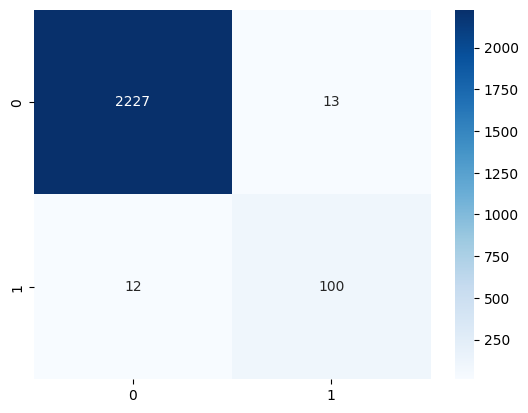

In [21]:
# create decision tree classifier to predict submission status
from sklearn import tree
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, f1_score, recall_score, precision_score, confusion_matrix
import seaborn as sns

new_df = merged_drop.select_dtypes(exclude=['object'])
new_df['SubmissionStatus'] = merged_drop['SubmissionStatus']

# split data into submission status = 'AP' and not
df_ap = new_df[new_df['SubmissionStatus'] == 'AP']
df_not_ap = new_df[new_df['SubmissionStatus'] != 'AP']
df_ap = df_ap.sample(n=7840-392, random_state=1)

# combine the two dataframes
df = pd.concat([df_ap, df_not_ap], axis=0)

# create X and y
X = df.drop(['SubmissionStatus'], axis=1)
y = df['SubmissionStatus']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=1)

# create decision tree classifier
clf = tree.DecisionTreeClassifier()

# train the model
clf = clf.fit(X_train, y_train)

# make predictions
y_pred = clf.predict(X_test)

# calculate the accuracy of the predictions with confusion matrix
cm = confusion_matrix(y_test, y_pred)

sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')

print('accuracy score: ' + str(accuracy_score(y_test, y_pred)))
print('f1 score: ' + str(f1_score(y_test, y_pred, average='macro', zero_division=0)))
print('recall score: ' + str(recall_score(y_test, y_pred, average='macro', zero_division=0)))
print('precision score: ' + str(precision_score(y_test, y_pred, average='macro', zero_division=0)))

In [190]:
# cross validation for decision tree model
from sklearn.model_selection import cross_val_score
import numpy as np

scores = np.mean(cross_val_score(clf, X, y, cv=5))
print(scores)

0.9776785714285715


In [191]:
# ratio of TA to AP
df['SubmissionStatus'].value_counts()


AP    7448
TA     392
Name: SubmissionStatus, dtype: int64

In [192]:
392 / 7840

0.05

In [165]:
import sklearn.tree as tree
import matplotlib.pyplot as plt

# output graphic of decision tree with column names and class names image big enough to see
plt.figure(figsize=(100, 100), dpi=200)
tree.plot_tree(clf, feature_names=X.columns, class_names=['AP', 'TA'], filled=True)

[Text(0.8886118461225321, 0.9875, 'Form_TABLET; ORAL <= 0.5\ngini = 0.097\nsamples = 5488\nvalue = [5208, 280]\nclass = AP'),
 Text(0.8032770201506209, 0.9625, 'SubmissionNo <= 1.5\ngini = 0.063\nsamples = 5380\nvalue = [5205, 175]\nclass = AP'),
 Text(0.6716873600651333, 0.9375, 'ApplType_ANDA <= 0.5\ngini = 0.339\nsamples = 706\nvalue = [553, 153]\nclass = AP'),
 Text(0.6358640341949928, 0.9125, 'ActiveIngredient_AMLODIPINE MALEATE; BENAZEPRIL HYDROCHLORIDE <= 0.5\ngini = 0.027\nsamples = 219\nvalue = [216, 3]\nclass = AP'),
 Text(0.6228373702422145, 0.8875, 'SponsorName_SICOR PHARMS <= 0.5\ngini = 0.009\nsamples = 217\nvalue = [216, 1]\nclass = AP'),
 Text(0.6098107062894362, 0.8625, 'gini = 0.0\nsamples = 216\nvalue = [216, 0]\nclass = AP'),
 Text(0.6358640341949928, 0.8625, 'gini = 0.0\nsamples = 1\nvalue = [0, 1]\nclass = TA'),
 Text(0.6488906981477712, 0.8875, 'gini = 0.0\nsamples = 2\nvalue = [0, 2]\nclass = TA'),
 Text(0.7075106859352738, 0.9125, 'Form_CAPSULE; ORAL <= 0.5\ngi

In [21]:

def fit_crossvalidate_clf(df, label, k=10, r=5, repeat=True):
    import sklearn.linear_model as lm, pandas as pd, sklearn.ensemble as se, numpy as np
    from sklearn.model_selection import KFold, RepeatedKFold, cross_val_score
    from numpy import mean, std
    from sklearn import svm
    from sklearn import gaussian_process
    from sklearn.gaussian_process.kernels import DotProduct, WhiteKernel
    from sklearn.neighbors import KNeighborsClassifier, KNeighborsRegressor
    from sklearn import svm
    from sklearn.naive_bayes import CategoricalNB
    # from xgboost import XGBClassifier
    from sklearn import preprocessing
    from sklearn.neural_network import MLPClassifier

    X = df.drop(columns=[label])
    y = df[label]

    if repeat:
        cv = RepeatedKFold(n_splits=k, n_repeats=r, random_state=12345)
    else:
        cv = KFold(n_splits=k, random_state=12345, shuffle=True)

    fit = {}    # Use this to store each of the fit metrics
    models = {} # Use this to store each of the models

    # Create the model objects
    model_log = lm.LogisticRegression(max_iter=100)
    model_logcv = lm.RidgeClassifier()
    model_sgd = lm.SGDClassifier(max_iter=1000, tol=1e-3)
    model_pa = lm.PassiveAggressiveClassifier(max_iter=1000, random_state=12345, tol=1e-3)
    model_per = lm.Perceptron(fit_intercept=False, max_iter=10, tol=None, shuffle=False)
    model_knn = KNeighborsClassifier(n_neighbors=3)
    model_svm = svm.SVC(decision_function_shape='ovo') # Remove the parameter for two-class model
    model_nb = CategoricalNB()
    model_bag = se.BaggingClassifier(KNeighborsClassifier(), max_samples=0.5, max_features=0.5)
    model_ada = se.AdaBoostClassifier(n_estimators=100, random_state=12345)
    model_ext = se.ExtraTreesClassifier(n_estimators=100, random_state=12345)
    model_rf = se.RandomForestClassifier(n_estimators=10)
    model_hgb = se.HistGradientBoostingClassifier(max_iter=100)
    model_vot = se.VotingClassifier(estimators=[('lr', model_log), ('rf', model_ext), ('gnb', model_hgb)], voting='hard')
    model_gb = se.GradientBoostingClassifier(n_estimators=100, learning_rate=1.0, max_depth=1, random_state=0)
    estimators = [('ridge', lm.RidgeCV()), ('lasso', lm.LassoCV(random_state=12345)), ('knr', KNeighborsRegressor(n_neighbors=20, metric='euclidean'))]
    final_estimator = se.GradientBoostingRegressor(n_estimators=25, subsample=0.5, min_samples_leaf=25, max_features=1, random_state=12345)
    model_st = se.StackingRegressor(estimators=estimators, final_estimator=final_estimator)
    # model_xgb = XGBClassifier()
    model_nn = MLPClassifier(solver='lbfgs', alpha=1e-5, hidden_layer_sizes=(5, 2), random_state=12345)

    # Fit a cross-validated R squared score and add it to the dict
    fit['Logistic'] = mean(cross_val_score(model_log, X, y, scoring='accuracy', cv=cv, n_jobs=-1))
    fit['Ridge'] = mean(cross_val_score(model_logcv, X, y, scoring='accuracy', cv=cv, n_jobs=-1))
    fit['SGD'] = mean(cross_val_score(model_sgd, X, y, scoring='accuracy', cv=cv, n_jobs=-1))
    fit['PassiveAggressive'] = mean(cross_val_score(model_pa, X, y, scoring='accuracy', cv=cv, n_jobs=-1))
    fit['Perceptron'] = mean(cross_val_score(model_per, X, y, scoring='accuracy', cv=cv, n_jobs=-1))
    fit['KNN'] = mean(cross_val_score(model_knn, X, y, scoring='accuracy', cv=cv, n_jobs=-1))
    fit['SVM'] = mean(cross_val_score(model_svm, X, y, scoring='accuracy', cv=cv, n_jobs=-1))
    fit['NaiveBayes'] = mean(cross_val_score(model_nb, X, y, scoring='accuracy', cv=cv, n_jobs=-1))
    fit['Bagging'] = mean(cross_val_score(model_bag, X, y, scoring='accuracy', cv=cv, n_jobs=-1))
    fit['AdaBoost'] = mean(cross_val_score(model_ada, X, y, scoring='accuracy', cv=cv, n_jobs=-1))
    fit['ExtraTrees'] = mean(cross_val_score(model_ext, X, y, scoring='accuracy', cv=cv, n_jobs=-1))
    fit['RandomForest'] = mean(cross_val_score(model_rf, X, y, scoring='accuracy', cv=cv, n_jobs=-1))
    fit['HistGradient'] = mean(cross_val_score(model_hgb, X, y, scoring='accuracy', cv=cv, n_jobs=-1))
    fit['Voting'] = mean(cross_val_score(model_vot, X, y, scoring='accuracy', cv=cv, n_jobs=-1))
    fit['GradBoost'] = mean(cross_val_score(model_gb, X, y, scoring='accuracy', cv=cv, n_jobs=-1))
    # fit['XGBoost'] = mean(cross_val_score(model_xgb, X, y, scoring='accuracy', cv=cv, n_jobs=-1))
    fit['NeuralN'] = mean(cross_val_score(model_nn, X, y, scoring='accuracy', cv=cv, n_jobs=-1))

    # Add the model to another dictionary; make sure the keys have the same names as the list above
    models['Logistic'] = model_log
    models['Ridge'] = model_logcv
    models['SGD'] = model_sgd
    models['PassiveAggressive'] = model_pa
    models['Perceptron'] = model_per
    models['KNN'] = model_knn
    models['SVM'] = model_svm
    models['NaiveBayes'] = model_nb
    models['Bagging'] = model_bag
    models['AdaBoost'] = model_ada
    models['ExtraTrees'] = model_ext
    models['RandomForest'] = model_rf
    models['HistGradient'] = model_hgb
    models['Voting'] = model_vot
    models['GradBoost'] = model_gb
    # models['XGBoost'] = model_xgb
    models['NeuralN'] = model_nn

    # Add the fit dictionary to a new DataFrame, sort, extract the top row, use it to retrieve the model object from the models dictionary
    df_fit = pd.DataFrame({'Accuracy':fit})
    df_fit.sort_values(by=['Accuracy'], ascending=False, inplace=True)
    best_model = df_fit.index[0]
    print(df_fit)

    return models[best_model].fit(X, y)

df_ap = new_df[new_df['SubmissionStatus'] == 'AP']
df_not_ap = new_df[new_df['SubmissionStatus'] != 'AP']
df_ap = df_ap.sample(n=7840, random_state=1)

# combine the two dataframes
df = pd.concat([df_ap, df_not_ap], axis=0)

model = fit_crossvalidate_clf(df, "SubmissionStatus")

/opt/homebrew/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/opt/homebrew/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_

                   Accuracy
ExtraTrees         0.993173
RandomForest       0.992371
NeuralN            0.990136
Voting             0.989990
KNN                0.988046
PassiveAggressive  0.986297
Ridge              0.985058
AdaBoost           0.984839
HistGradient       0.984111
SGD                0.983844
Logistic           0.983357
GradBoost          0.980466
Bagging            0.976384
SVM                0.952381
Perceptron         0.052770
NaiveBayes              NaN


In [200]:
import sklearn.linear_model as lm, pandas as pd, sklearn.ensemble as se, numpy as np

# create ExtraTreesClassifier object
clf = se.ExtraTreesClassifier(n_estimators=100, random_state=12345)

# fit the model
clf.fit(X, y)

# create a list of feature names
feature_names = list(df.columns)

# create a list of feature importances
feature_importances = list(clf.feature_importances_)

# create a list of tuples with feature names and feature importances
feature_importances = [(feature, round(importance, 2)) for feature, importance in zip(feature_names, feature_importances)]

# sort the feature importances in descending order
feature_importances = sorted(feature_importances, key = lambda x: x[1], reverse = True)

# print the feature importances
[print('Variable: {} Importance: {}'.format(*pair)) for pair in feature_importances]



Variable: Form_TABLET; ORAL Importance: 0.19
Variable: SubmissionNo Importance: 0.04
Variable: SponsorName_RANBAXY LABS LTD Importance: 0.03
Variable: SponsorName_ROXANE Importance: 0.03
Variable: ReviewPriority_UNKOWN Importance: 0.02
Variable: Form_CAPSULE; ORAL Importance: 0.02
Variable: Form_INJECTABLE; INJECTION Importance: 0.02
Variable: ActiveIngredient_FLUCONAZOLE Importance: 0.02
Variable: ReviewPriority_STANDARD Importance: 0.01
Variable: ApplType_ANDA Importance: 0.01
Variable: ApplType_NDA Importance: 0.01
Variable: SponsorName_AKORN Importance: 0.01
Variable: SponsorName_CIPLA LIMITED Importance: 0.01
Variable: SponsorName_EMCURE PHARMA Importance: 0.01
Variable: SponsorName_GEDEON RICHTER USA Importance: 0.01
Variable: SponsorName_LEK PHARM Importance: 0.01
Variable: SponsorName_MYLAN Importance: 0.01
Variable: SponsorName_PLIVA HRVATSKA DOO Importance: 0.01
Variable: SponsorName_PUREPAC PHARM Importance: 0.01
Variable: SponsorName_RANBAXY Importance: 0.01
Variable: Spons

[None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,

In [168]:
# visualize extra trees classifier
import matplotlib.pyplot as plt

plt.figure(figsize=(100, 100), dpi=350)
tree.plot_tree(clf.estimators_[0], feature_names=X.columns, class_names=['AP', 'TA'], filled=True)
plt.savefig('extra_trees_visible.png')

In [194]:
# new analysis of the data
# create isolation forest for dataset to detect anomalies
from sklearn.ensemble import IsolationForest

# create isolation forest object
clf = IsolationForest(n_estimators=100, max_samples='auto', contamination=float(0.1), max_features=1.0, bootstrap=False, n_jobs=-1, random_state=12345, verbose=0)

# fit the model
clf.fit(X)

# predict the model
y_pred = clf.predict(X)

# add the prediction to the dataframe
df['anomaly'] = y_pred

# create a list of outliers
outliers = df.loc[df['anomaly'] == -1]

# output the outliers
outliers

# calculate what percentage of the data is outliers
outlier_percentage = len(outliers) / len(df)
print(outlier_percentage)


/opt/homebrew/lib/python3.10/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


0.1


In [195]:
outliers['SubmissionStatus'].value_counts()

AP    783
TA      1
Name: SubmissionStatus, dtype: int64

In [196]:
1 / 784

0.0012755102040816326

In [197]:
df['SubmissionStatus'].value_counts()

AP    7448
TA     392
Name: SubmissionStatus, dtype: int64

In [198]:
df['SponsorName_ROXANE'].value_counts()

0    7811
1      29
Name: SponsorName_ROXANE, dtype: int64